In [9]:
# importing required libaries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Dataset Description

1. brand: The make or manufacturer of the car (e.g., Toyota, Ford, BMW).
2. model: The specific model of the car (e.g., Corolla, Mustang, 3 Series).
3. model_year: The year the car model was manufactured or released.
4. milage: The total distance the car has been driven, typically measured in miles or kilometers.
5. fuel_type: The type of fuel the car uses (e.g., petrol, diesel, electric, hybrid).
6. engine: Information about the car's engine, possibly including displacement (e.g., 2.0L, 3.5L) or engine configuration.
7. transmission: The type of transmission the car has (e.g., manual, automatic, CVT).
8. ext_col: The exterior color of the car (e.g., red, black, silver).
9. int_col: The interior color of the car (e.g., beige, black, gray).
10. accident: Indicates whether the car has been in an accident (likely a binary feature, e.g., yes/no).
11. clean_title: Indicates whether the car has a clean title, meaning it hasn't been severely damaged or written off (likely a binary feature, e.g., yes/no).
12. price: The selling price of the car, which is the target variable for regression analysis.

In [10]:
df=pd.read_csv(r"C:\Users\santh\Downloads\used_cars.csv")
df.head(10)


,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price
0,Ford,Utility Police Interceptor Base,2013,"51,000 mi.",E85 Flex Fuel,300.0HP 3.7L V6 Cylinder Engine Flex Fuel Capa...,6-Speed A/T,Black,Black,At least 1 accident or damage reported,Yes,"$10,300"
1,Hyundai,Palisade SEL,2021,"34,742 mi.",Gasoline,3.8L V6 24V GDI DOHC,8-Speed Automatic,Moonlight Cloud,Gray,At least 1 accident or damage reported,Yes,"$38,005"
2,Lexus,RX 350 RX 350,2022,"22,372 mi.",Gasoline,3.5 Liter DOHC,Automatic,Blue,Black,None reported,NaN,"$54,598"
3,INFINITI,Q50 Hybrid Sport,2015,"88,900 mi.",Hybrid,354.0HP 3.5L V6 Cylinder Engine Gas/Electric H...,7-Speed A/T,Black,Black,None reported,Yes,"$15,500"
4,Audi,Q3 45 S line Premium Plus,2021,"9,835 mi.",Gasoline,2.0L I4 16V GDI DOHC Turbo,8-Speed Automatic,Glacier White Metallic,Black,None reported,NaN,"$34,999"
5,Acura,ILX 2.4L,2016,"136,397 mi.",Gasoline,2.4 Liter,F,Silver,Ebony.,None reported,NaN,"$14,798"
6,Audi,S3 2.0T Premium Plus,2017,"84,000 mi.",Gasoline,292.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,6-Speed A/T,Blue,Black,None reported,Yes,"$31,000"
7,BMW,740 iL,2001,"242,000 mi.",Gasoline,282.0HP 4.4L 8 Cylinder Engine Gasoline Fuel,A/T,Green,Green,None reported,Yes,"$7,300"
8,Lexus,RC 350 F Sport,2021,"23,436 mi.",Gasoline,311.0HP 3.5L V6 Cylinder Engine Gasoline Fuel,6-Speed A/T,Black,Black,None reported,Yes,"$41,927"
9,Tesla,Model X Long Range Plus,2020,"34,000 mi.",NaN,534.0HP Electric Motor Electric Fuel System,A/T,Black,Black,None reported,Yes,"$69,950"


In [11]:
df.columns

Index(['brand', 'model', 'model_year', 'milage', 'fuel_type', 'engine',
       'transmission', 'ext_col', 'int_col', 'accident', 'clean_title',
       'price'],
      dtype='object')

In [12]:
df.dtypes

brand           object
model           object
model_year       int64
milage          object
fuel_type       object
engine          object
transmission    object
ext_col         object
int_col         object
accident        object
clean_title     object
price           object
dtype: object

In [13]:
df.shape

(4009, 12)

# checking for missing values 

In [14]:
df.isnull().sum()

brand             0
model             0
model_year        0
milage            0
fuel_type       170
engine            0
transmission      0
ext_col           0
int_col           0
accident        113
clean_title     596
price             0
dtype: int64

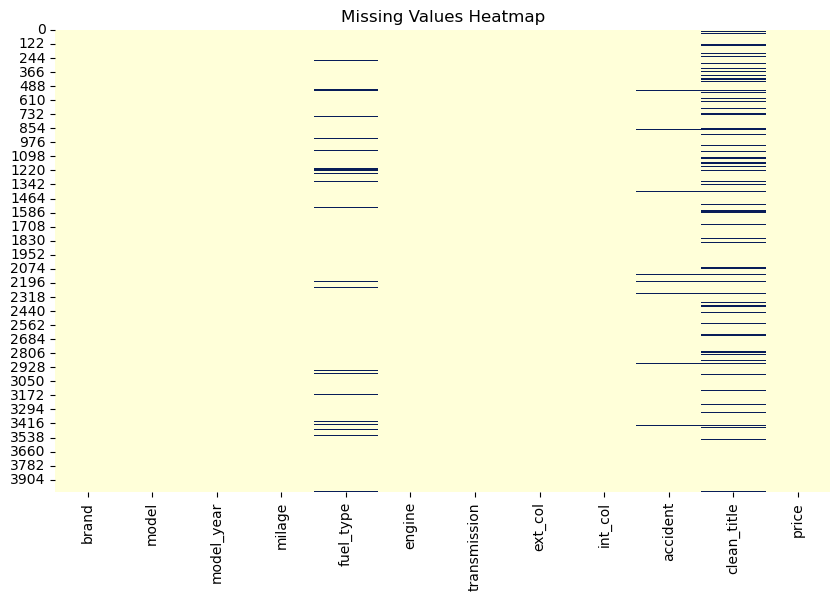

brand             0
model             0
model_year        0
milage            0
fuel_type       170
engine            0
transmission      0
ext_col           0
int_col           0
accident        113
clean_title     596
price             0
dtype: int64


In [15]:


# Visualize missing values
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap="YlGnBu")
plt.title('Missing Values Heatmap')
plt.show()

# Count missing values in each column
missing_values = df.isnull().sum()
print(missing_values)


In [16]:
missing_values = df.isnull().sum()


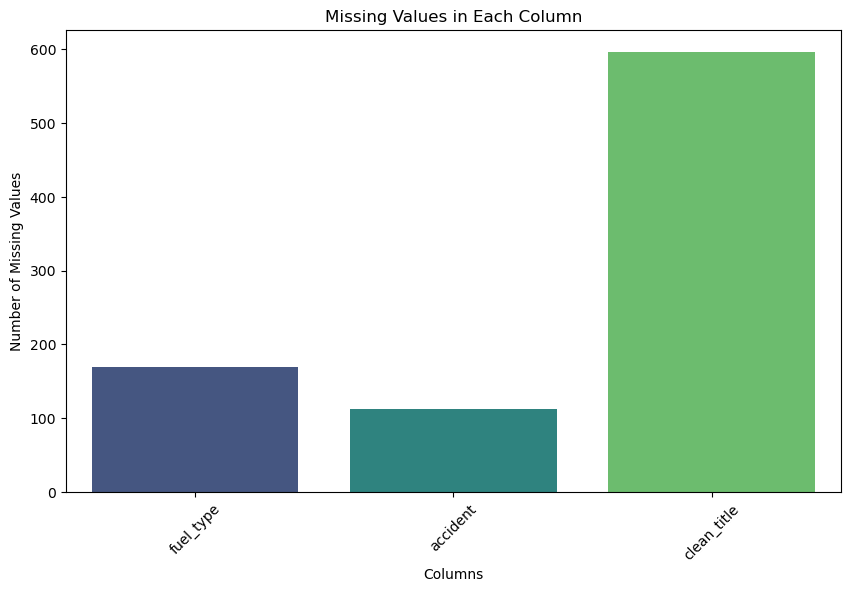

In [17]:
# Filter out columns with no missing values
missing_values = missing_values[missing_values > 0]

# Plotting the missing values
plt.figure(figsize=(10, 6))
sns.barplot(x=missing_values.index, y=missing_values.values, palette="viridis")
plt.title("Missing Values in Each Column")
plt.xlabel("Columns")
plt.ylabel("Number of Missing Values")
plt.xticks(rotation=45)
plt.show()


# checking for Duplicate values

In [18]:
duplicates = df[df.duplicated()]
num_duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {num_duplicates}")


Number of duplicate rows: 0


# Handling for Missing values

In [19]:
# Display the initial count of missing values in each column
print("Missing values before handling:")
print(df.isnull().sum())

# Handling missing values:

# 1. 'fuel_type': This column has 170 missing values.
#    Since it's a categorical column, you can either fill the missing values with the most frequent category or a placeholder like "Unknown".
df['fuel_type'].fillna(df['fuel_type'].mode()[0], inplace=True)  # Using mode (most frequent value)

# 2. 'accident': This column has 113 missing values.
#    Similar to 'fuel_type', you can fill the missing values with the most frequent category or a placeholder.
df['accident'].fillna(df['accident'].mode()[0], inplace=True)  # Using mode (most frequent value)

# 3. 'clean_title': This column has 596 missing values.
#    This seems to be a significant portion of the data, and since it likely represents a binary category (e.g., "Yes" or "No"),
#    you can fill missing values with the most common value or drop rows with missing values if the data is unreliable.
df['clean_title'].fillna(df['clean_title'].mode()[0], inplace=True)  # Using mode (most frequent value)
# Alternatively, drop rows with missing 'clean_title' values if you prefer:
# df.dropna(subset=['clean_title'], inplace=True)

# Display the count of missing values after handling
print("\nMissing values after handling:")
print(df.isnull().sum())

Missing values before handling:
brand             0
model             0
model_year        0
milage            0
fuel_type       170
engine            0
transmission      0
ext_col           0
int_col           0
accident        113
clean_title     596
price             0
dtype: int64

Missing values after handling:
brand           0
model           0
model_year      0
milage          0
fuel_type       0
engine          0
transmission    0
ext_col         0
int_col         0
accident        0
clean_title     0
price           0
dtype: int64


In [20]:
df

,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price
0,Ford,Utility Police Interceptor Base,2013,"51,000 mi.",E85 Flex Fuel,300.0HP 3.7L V6 Cylinder Engine Flex Fuel Capa...,6-Speed A/T,Black,Black,At least 1 accident or damage reported,Yes,"$10,300"
1,Hyundai,Palisade SEL,2021,"34,742 mi.",Gasoline,3.8L V6 24V GDI DOHC,8-Speed Automatic,Moonlight Cloud,Gray,At least 1 accident or damage reported,Yes,"$38,005"
2,Lexus,RX 350 RX 350,2022,"22,372 mi.",Gasoline,3.5 Liter DOHC,Automatic,Blue,Black,None reported,Yes,"$54,598"
3,INFINITI,Q50 Hybrid Sport,2015,"88,900 mi.",Hybrid,354.0HP 3.5L V6 Cylinder Engine Gas/Electric H...,7-Speed A/T,Black,Black,None reported,Yes,"$15,500"
4,Audi,Q3 45 S line Premium Plus,2021,"9,835 mi.",Gasoline,2.0L I4 16V GDI DOHC Turbo,8-Speed Automatic,Glacier White Metallic,Black,None reported,Yes,"$34,999"
...,...,...,...,...,...,...,...,...,...,...,...,...
4004,Bentley,Continental GT Speed,2023,714 mi.,Gasoline,6.0L W12 48V PDI DOHC Twin Turbo,8-Speed Automatic with Auto-Shift,C / C,Hotspur,None reported,Yes,"$349,950"
4005,Audi,S4 3.0T Premium Plus,2022,"10,900 mi.",Gasoline,349.0HP 3.0L V6 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Black,Black,None reported,Yes,"$53,900"
4006,Porsche,Taycan,2022,"2,116 mi.",Gasoline,Electric,Automatic,Black,Black,None reported,Yes,"$90,998"
4007,Ford,F-150 Raptor,2020,"33,000 mi.",Gasoline,450.0HP 3.5L V6 Cylinder Engine Gasoline Fuel,A/T,Blue,Black,None reported,Yes,"$62,999"


# Feature Engineering

In [21]:
# Convert 'milage' to numeric
# First, convert the column to string, then remove any commas and extract numerical values
df['milage'] = df['milage'].astype(str).str.replace(',', '').str.extract('(\d+)').astype(float)

# Convert 'price' to numeric
# First, convert the column to string, then remove dollar signs and commas, then convert to float
df['price'] = df['price'].astype(str).str.replace('[\$,]', '', regex=True).astype(float)



<>:3: DeprecationWarning: invalid escape sequence '\d'
<>:7: DeprecationWarning: invalid escape sequence '\$'
<>:3: DeprecationWarning: invalid escape sequence '\d'
<>:7: DeprecationWarning: invalid escape sequence '\$'
C:\Users\santh\AppData\Local\Temp\ipykernel_5048\2370082881.py:3: DeprecationWarning: invalid escape sequence '\d'
  df['milage'] = df['milage'].astype(str).str.replace(',', '').str.extract('(\d+)').astype(float)
C:\Users\santh\AppData\Local\Temp\ipykernel_5048\2370082881.py:7: DeprecationWarning: invalid escape sequence '\$'
  df['price'] = df['price'].astype(str).str.replace('[\$,]', '', regex=True).astype(float)


In [22]:
# Create a new feature for car age
df['car_age'] = 2024 - df['model_year']
df['car_age']

0       11
1        3
2        2
3        9
4        3
        ..
4004     1
4005     2
4006     2
4007     4
4008     4
Name: car_age, Length: 4009, dtype: int64

In [23]:
df

,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price,car_age
0,Ford,Utility Police Interceptor Base,2013,51000.0,E85 Flex Fuel,300.0HP 3.7L V6 Cylinder Engine Flex Fuel Capa...,6-Speed A/T,Black,Black,At least 1 accident or damage reported,Yes,10300.0,11
1,Hyundai,Palisade SEL,2021,34742.0,Gasoline,3.8L V6 24V GDI DOHC,8-Speed Automatic,Moonlight Cloud,Gray,At least 1 accident or damage reported,Yes,38005.0,3
2,Lexus,RX 350 RX 350,2022,22372.0,Gasoline,3.5 Liter DOHC,Automatic,Blue,Black,None reported,Yes,54598.0,2
3,INFINITI,Q50 Hybrid Sport,2015,88900.0,Hybrid,354.0HP 3.5L V6 Cylinder Engine Gas/Electric H...,7-Speed A/T,Black,Black,None reported,Yes,15500.0,9
4,Audi,Q3 45 S line Premium Plus,2021,9835.0,Gasoline,2.0L I4 16V GDI DOHC Turbo,8-Speed Automatic,Glacier White Metallic,Black,None reported,Yes,34999.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4004,Bentley,Continental GT Speed,2023,714.0,Gasoline,6.0L W12 48V PDI DOHC Twin Turbo,8-Speed Automatic with Auto-Shift,C / C,Hotspur,None reported,Yes,349950.0,1
4005,Audi,S4 3.0T Premium Plus,2022,10900.0,Gasoline,349.0HP 3.0L V6 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Black,Black,None reported,Yes,53900.0,2
4006,Porsche,Taycan,2022,2116.0,Gasoline,Electric,Automatic,Black,Black,None reported,Yes,90998.0,2
4007,Ford,F-150 Raptor,2020,33000.0,Gasoline,450.0HP 3.5L V6 Cylinder Engine Gasoline Fuel,A/T,Blue,Black,None reported,Yes,62999.0,4


In [24]:


# Encode categorical features using one-hot encoding
df_encoded = pd.get_dummies(df, columns=['brand', 'model', 'fuel_type', 'transmission', 'ext_col', 'int_col', 'accident', 'clean_title'], drop_first=True)

# Check the transformed DataFrame
print(df_encoded.head())


   model_year   milage                                             engine  \
0        2013  51000.0  300.0HP 3.7L V6 Cylinder Engine Flex Fuel Capa...   
1        2021  34742.0                               3.8L V6 24V GDI DOHC   
2        2022  22372.0                                     3.5 Liter DOHC   
3        2015  88900.0  354.0HP 3.5L V6 Cylinder Engine Gas/Electric H...   
4        2021   9835.0                         2.0L I4 16V GDI DOHC Turbo   

     price  car_age  brand_Alfa  brand_Aston  brand_Audi  brand_BMW  \
0  10300.0       11           0            0           0          0   
1  38005.0        3           0            0           0          0   
2  54598.0        2           0            0           0          0   
3  15500.0        9           0            0           0          0   
4  34999.0        3           0            0           1          0   

   brand_Bentley  ...  int_col_Tupelo  int_col_Very Light Cashmere  \
0              0  ...               0   

In [25]:
df.dtypes

brand            object
model            object
model_year        int64
milage          float64
fuel_type        object
engine           object
transmission     object
ext_col          object
int_col          object
accident         object
clean_title      object
price           float64
car_age           int64
dtype: object

In [26]:
# checking for statistical information

df.describe()

,model_year,milage,price,car_age
count,4009.000000,4009.000000,4.009000e+03,4009.000000
mean,2015.515590,64717.551010,4.455319e+04,8.484410
std,6.104816,52296.599459,7.871064e+04,6.104816
min,1974.000000,100.000000,2.000000e+03,0.000000
25%,2012.000000,23044.000000,1.720000e+04,4.000000
50%,2017.000000,52775.000000,3.100000e+04,7.000000
75%,2020.000000,94100.000000,4.999000e+04,12.000000
max,2024.000000,405000.000000,2.954083e+06,50.000000


# Data Analysis

In [27]:
df.dtypes

brand            object
model            object
model_year        int64
milage          float64
fuel_type        object
engine           object
transmission     object
ext_col          object
int_col          object
accident         object
clean_title      object
price           float64
car_age           int64
dtype: object

In [28]:
df

,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price,car_age
0,Ford,Utility Police Interceptor Base,2013,51000.0,E85 Flex Fuel,300.0HP 3.7L V6 Cylinder Engine Flex Fuel Capa...,6-Speed A/T,Black,Black,At least 1 accident or damage reported,Yes,10300.0,11
1,Hyundai,Palisade SEL,2021,34742.0,Gasoline,3.8L V6 24V GDI DOHC,8-Speed Automatic,Moonlight Cloud,Gray,At least 1 accident or damage reported,Yes,38005.0,3
2,Lexus,RX 350 RX 350,2022,22372.0,Gasoline,3.5 Liter DOHC,Automatic,Blue,Black,None reported,Yes,54598.0,2
3,INFINITI,Q50 Hybrid Sport,2015,88900.0,Hybrid,354.0HP 3.5L V6 Cylinder Engine Gas/Electric H...,7-Speed A/T,Black,Black,None reported,Yes,15500.0,9
4,Audi,Q3 45 S line Premium Plus,2021,9835.0,Gasoline,2.0L I4 16V GDI DOHC Turbo,8-Speed Automatic,Glacier White Metallic,Black,None reported,Yes,34999.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4004,Bentley,Continental GT Speed,2023,714.0,Gasoline,6.0L W12 48V PDI DOHC Twin Turbo,8-Speed Automatic with Auto-Shift,C / C,Hotspur,None reported,Yes,349950.0,1
4005,Audi,S4 3.0T Premium Plus,2022,10900.0,Gasoline,349.0HP 3.0L V6 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Black,Black,None reported,Yes,53900.0,2
4006,Porsche,Taycan,2022,2116.0,Gasoline,Electric,Automatic,Black,Black,None reported,Yes,90998.0,2
4007,Ford,F-150 Raptor,2020,33000.0,Gasoline,450.0HP 3.5L V6 Cylinder Engine Gasoline Fuel,A/T,Blue,Black,None reported,Yes,62999.0,4


In [29]:
top_5_prices = df.sort_values(by='price', ascending=False).head(5)
top_5_prices


,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price,car_age
693,Maserati,Quattroporte Base,2005,32000.0,Gasoline,394.0HP 4.2L 8 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Red,Beige,At least 1 accident or damage reported,Yes,2954083.0,19
229,Bugatti,Veyron 16.4 Grand Sport,2011,6330.0,Gasoline,8.0L W16 64V GDI DOHC Twin Turbo,7-Speed Automatic with Auto-Shift,White,White,None reported,Yes,1950995.0,13
3046,Porsche,Carrera GT Base,2005,4400.0,Gasoline,605.0HP 5.7L 10 Cylinder Engine Gasoline Fuel,6-Speed M/T,Gray,Black,None reported,Yes,1599000.0,19
1356,Lamborghini,Aventador SVJ Base,2021,6987.0,Gasoline,6.5L V12 48V MPFI DOHC,7-Speed,–,Nero Ade,None reported,Yes,749950.0,3
624,Rolls-Royce,Cullinan,2022,398.0,Gasoline,6.7L V12 48V GDI DOHC Twin Turbo,8-Speed Automatic,Silver,Charles Blue,None reported,Yes,695000.0,2


# Car Vs Price

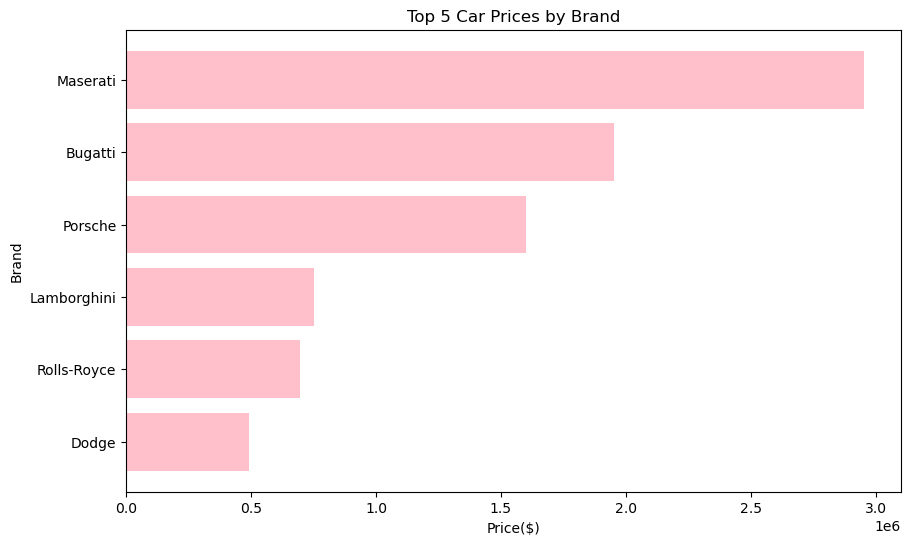

In [30]:
# top5 car prices

top_5_prices = df.sort_values(by='price', ascending=False).head(10)

# Plotting the top 5 prices with their corresponding brands
plt.figure(figsize=(10, 6))
plt.barh(top_5_prices['brand'], top_5_prices['price'], color='pink')
plt.xlabel('Price($)')
plt.ylabel('Brand')
plt.title('Top 5 Car Prices by Brand')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest price at the top
plt.show()

# The top 5 cars prize according to by brand

1. Maserati----->2954083.0(in dollars)
2. Bugatti----->1950995.0(in dollars)
3. Porsche----->	1599000.0(in dollars)
4. Lamborghini----->749950.0(in dollars)
5. Rolls-Royce----->695000.0(in dollars)

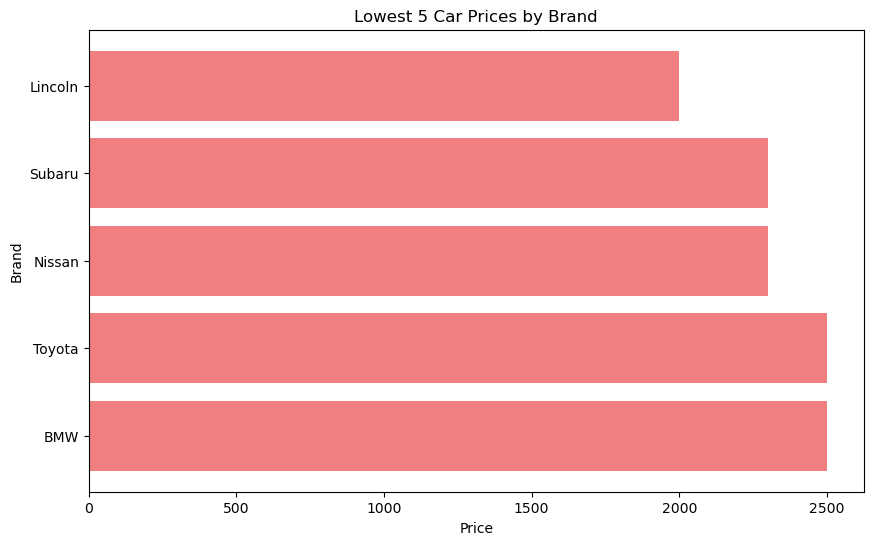

In [31]:


low_5_prices = df.sort_values(by='price', ascending=True).head(5)

# Plotting the lowest 5 prices with their corresponding brands
plt.figure(figsize=(10, 6))
plt.barh(low_5_prices['brand'], low_5_prices['price'], color='lightcoral')
plt.xlabel('Price')
plt.ylabel('Brand')
plt.title('Lowest 5 Car Prices by Brand')
plt.gca().invert_yaxis()  # Invert y-axis to have the lowest price at the top
plt.show()

In [32]:
# low_5_price

low_5_prices = df[['price', 'brand']].sort_values(by='price', ascending=True).head(5)
low_5_prices


,price,brand
425,2000.0,Lincoln
89,2300.0,Subaru
3640,2300.0,Nissan
3907,2500.0,Toyota
1292,2500.0,BMW


# Model Year Vs Price

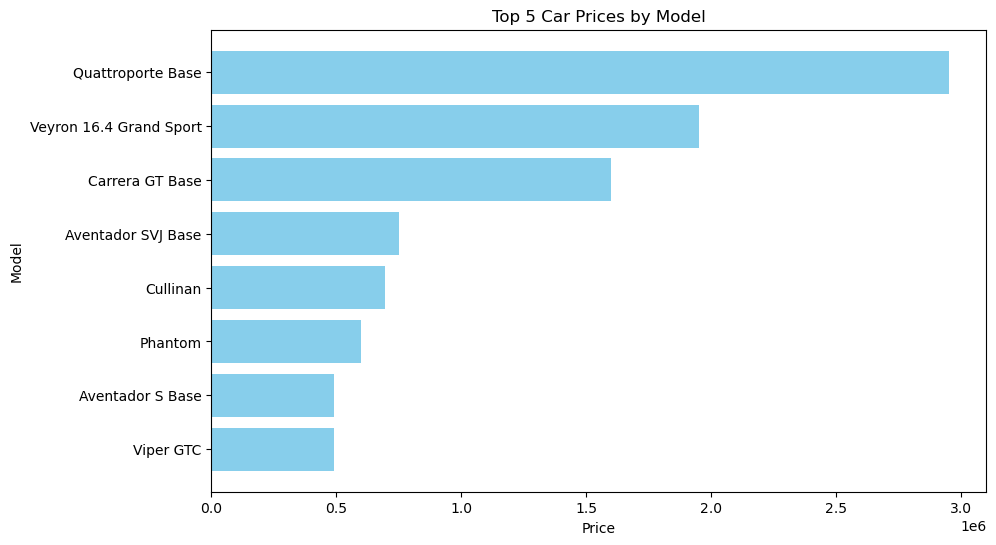

In [33]:


# Plotting the top 5 prices with their corresponding models
plt.figure(figsize=(10, 6))
plt.barh(top_5_prices['model'], top_5_prices['price'], color='skyblue')
plt.xlabel('Price')
plt.ylabel('Model')
plt.title('Top 5 Car Prices by Model')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest price at the top
plt.show()

# inferences
# top 5 cars by model year are 

1. Maserati
2. Bugatti
3. Porsche
4. Lamborghini
5. Rolls-Royce

In [34]:
df

,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price,car_age
0,Ford,Utility Police Interceptor Base,2013,51000.0,E85 Flex Fuel,300.0HP 3.7L V6 Cylinder Engine Flex Fuel Capa...,6-Speed A/T,Black,Black,At least 1 accident or damage reported,Yes,10300.0,11
1,Hyundai,Palisade SEL,2021,34742.0,Gasoline,3.8L V6 24V GDI DOHC,8-Speed Automatic,Moonlight Cloud,Gray,At least 1 accident or damage reported,Yes,38005.0,3
2,Lexus,RX 350 RX 350,2022,22372.0,Gasoline,3.5 Liter DOHC,Automatic,Blue,Black,None reported,Yes,54598.0,2
3,INFINITI,Q50 Hybrid Sport,2015,88900.0,Hybrid,354.0HP 3.5L V6 Cylinder Engine Gas/Electric H...,7-Speed A/T,Black,Black,None reported,Yes,15500.0,9
4,Audi,Q3 45 S line Premium Plus,2021,9835.0,Gasoline,2.0L I4 16V GDI DOHC Turbo,8-Speed Automatic,Glacier White Metallic,Black,None reported,Yes,34999.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4004,Bentley,Continental GT Speed,2023,714.0,Gasoline,6.0L W12 48V PDI DOHC Twin Turbo,8-Speed Automatic with Auto-Shift,C / C,Hotspur,None reported,Yes,349950.0,1
4005,Audi,S4 3.0T Premium Plus,2022,10900.0,Gasoline,349.0HP 3.0L V6 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Black,Black,None reported,Yes,53900.0,2
4006,Porsche,Taycan,2022,2116.0,Gasoline,Electric,Automatic,Black,Black,None reported,Yes,90998.0,2
4007,Ford,F-150 Raptor,2020,33000.0,Gasoline,450.0HP 3.5L V6 Cylinder Engine Gasoline Fuel,A/T,Blue,Black,None reported,Yes,62999.0,4


# model vs price(Yearly)

<Figure size 1400x1000 with 0 Axes>

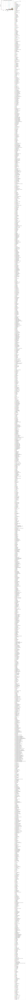

In [35]:
# Group by 'model_year' and 'model', then calculate the average price
yearly_price_trend = df.groupby(['model_year', 'model'])['price'].mean().unstack()

# Plotting the year-wise increase in price for each car model
plt.figure(figsize=(14, 10))
yearly_price_trend.plot(marker='o')

# Adding titles and labels
plt.title('Year-wise Increase in Car Price by Model')
plt.xlabel('Model Year')
plt.ylabel('Average Price')
plt.legend(title='Car Model', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

# Top 5 models according to car prize are

1. 124 spider Abarth
2. 128I
3. 135I
4. 135is
5. 1500 big Horn

# Exploring the Data Distribution

# Uni-variate Analysis

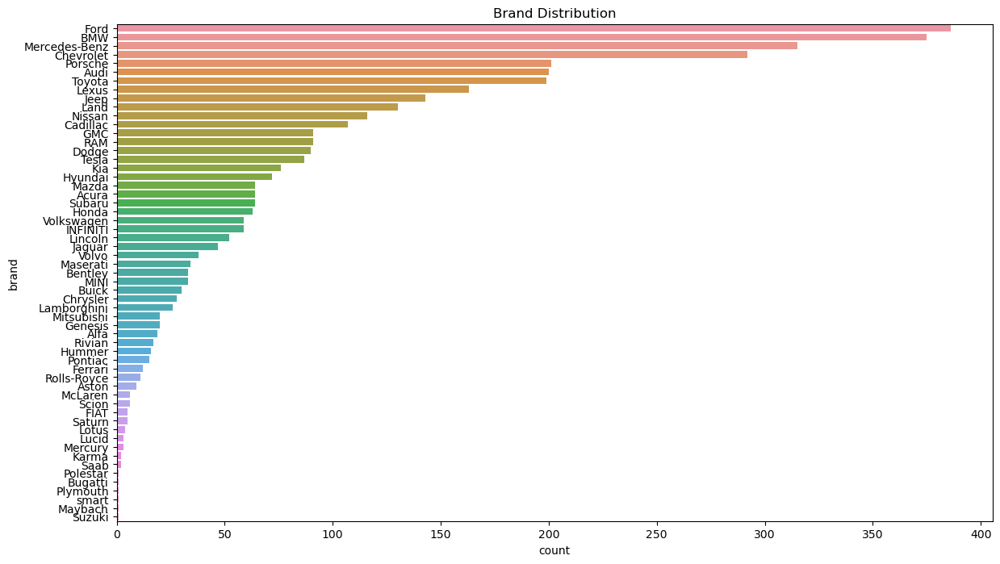

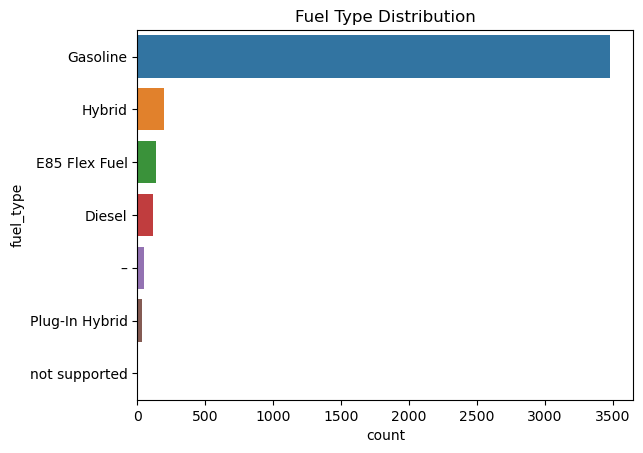

In [36]:
# Bar plot for categorical features
plt.figure(figsize=(14, 8))
sns.countplot(y='brand', data=df, order=df['brand'].value_counts().index)
plt.title('Brand Distribution')
plt.show()

sns.countplot(y='fuel_type', data=df, order=df['fuel_type'].value_counts().index)
plt.title('Fuel Type Distribution')
plt.show()


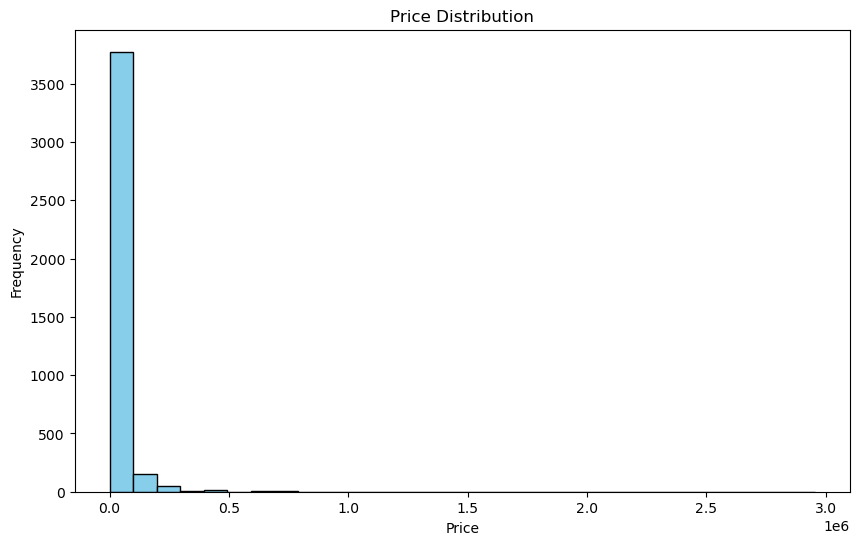

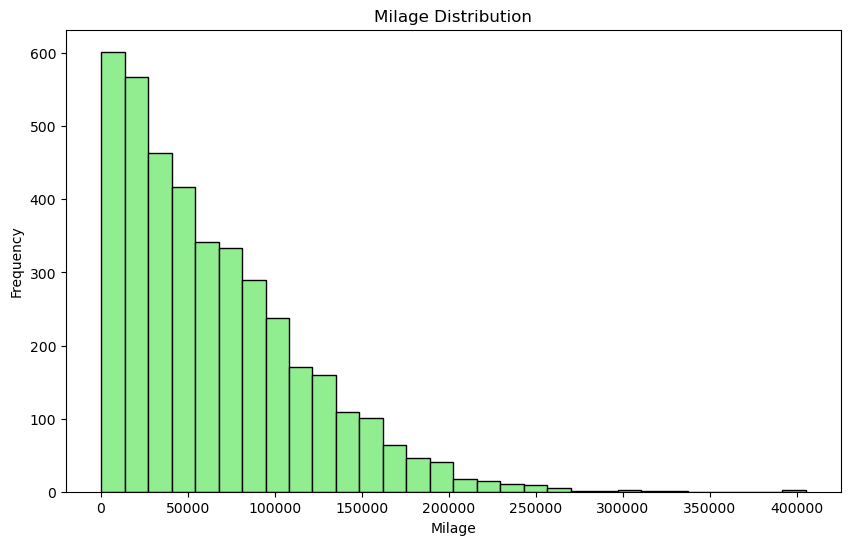

In [37]:
# Histogram for numerical features
df['price'].plot(kind='hist', bins=30, color='skyblue', edgecolor='black', figsize=(10, 6))
plt.title('Price Distribution')
plt.xlabel('Price')
plt.show()

df['milage'].plot(kind='hist', bins=30, color='lightgreen', edgecolor='black', figsize=(10, 6))
plt.title('Milage Distribution')
plt.xlabel('Milage')
plt.show()


# Bivariate Analysis

Explore relationships between features.



# Correlation Analysis

C:\Users\santh\AppData\Local\Temp\ipykernel_5048\3022678218.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap='coolwarm')


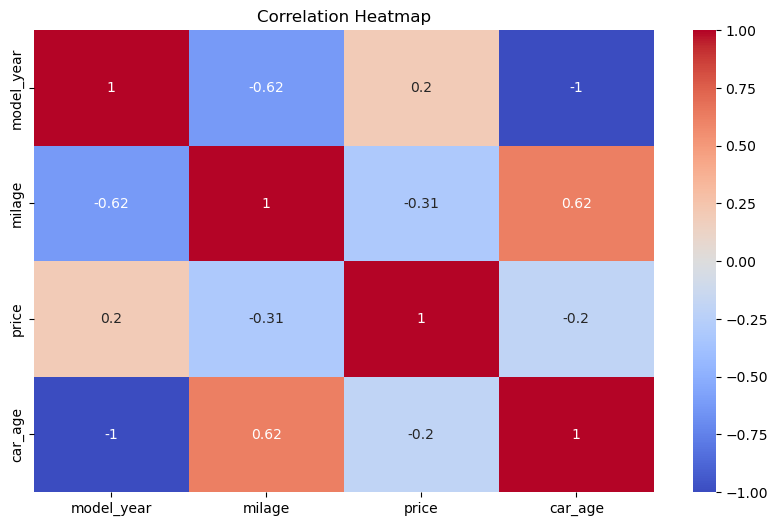

In [38]:
# Correlation heatmap for numerical features
plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


# Categorical vs. Numerical

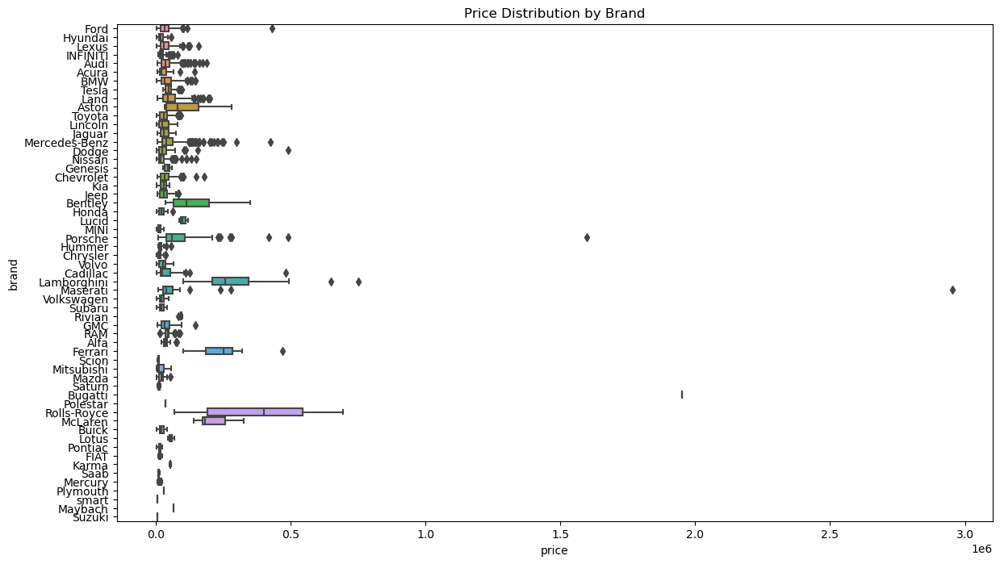

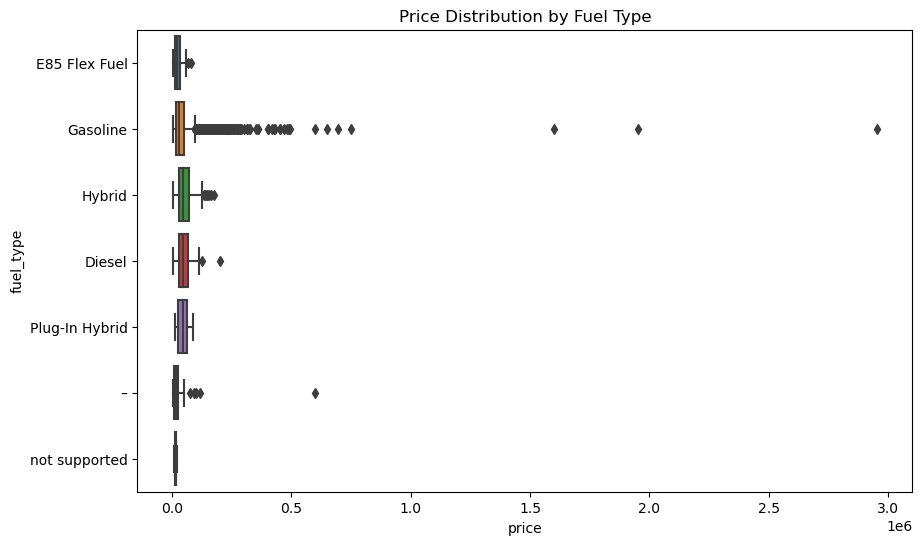

In [39]:
# Box plot for price vs. brand
plt.figure(figsize=(14, 8))
sns.boxplot(x='price', y='brand', data=df)
plt.title('Price Distribution by Brand')
plt.show()

# Box plot for price vs. fuel_type
plt.figure(figsize=(10, 6))
sns.boxplot(x='price', y='fuel_type', data=df)
plt.title('Price Distribution by Fuel Type')
plt.show()


# Multivariate Analysis

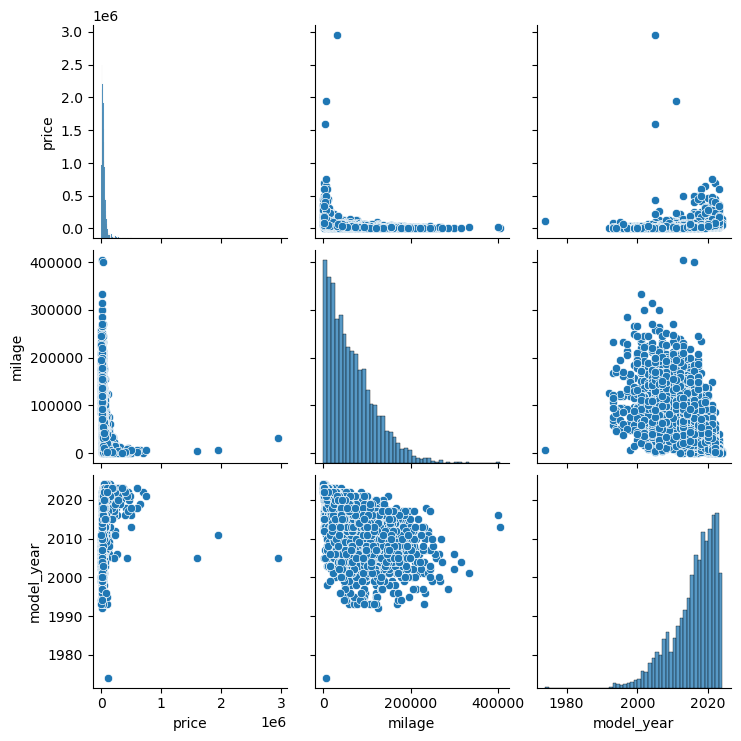

In [40]:
# Pair plot for a subset of features
sns.pairplot(df[['price', 'milage', 'model_year']])
plt.show()


# Outlier Detection
Identify and visualize outliers.

In [41]:
import pandas as pd

# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df[['price', 'milage']].quantile(0.25)
Q3 = df[['price', 'milage']].quantile(0.75)

# Calculate the Interquartile Range (IQR)
IQR = Q3 - Q1

# Define the outlier boundaries
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

print("Lower Bound:\n", lower_bound)
print("Upper Bound:\n", upper_bound)


Lower Bound:
 price    -31985.0
milage   -83540.0
dtype: float64
Upper Bound:
 price      99175.0
milage    200684.0
dtype: float64


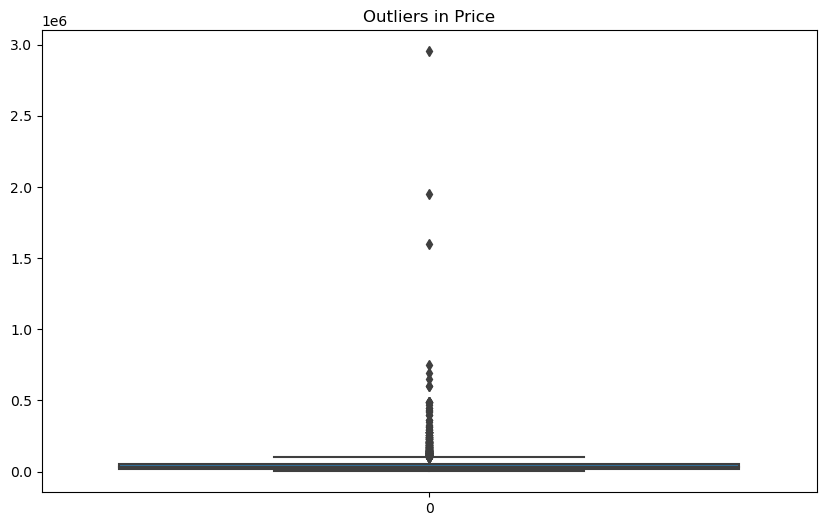

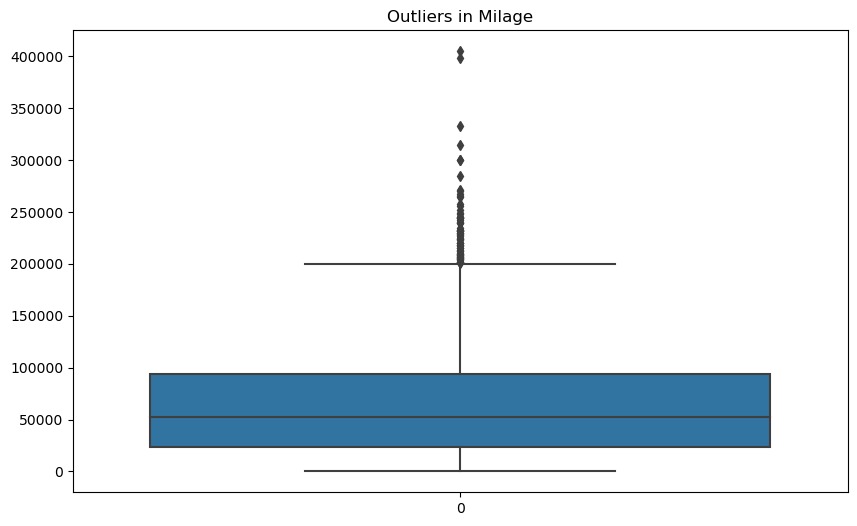

In [42]:
# Box plot to detect outliers in price
plt.figure(figsize=(10, 6))
sns.boxplot(df['price'])
plt.title('Outliers in Price')
plt.show()

# Box plot to detect outliers in milage
plt.figure(figsize=(10, 6))
sns.boxplot(df['milage'])
plt.title('Outliers in Milage')
plt.show()


# Removing Outliers
One approach is to remove rows where the price or milage is outside the defined boundaries.

In [43]:
import pandas as pd

# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df[['price', 'milage']].quantile(0.25)
Q3 = df[['price', 'milage']].quantile(0.75)

# Calculate the Interquartile Range (IQR)
IQR = Q3 - Q1

# Define the outlier boundaries
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

lower_bound ,upper_bound


(price    -31985.0
 milage   -83540.0
 dtype: float64,
 price      99175.0
 milage    200684.0
 dtype: float64)

# Capping Outliers
Another approach is to cap the outliers at the boundary values.

In [44]:
# Cap the outliers
df['price'] = df['price'].apply(lambda x: upper_bound['price'] if x > upper_bound['price'] else lower_bound['price'] if x < lower_bound['price'] else x)
df['milage'] = df['milage'].apply(lambda x: upper_bound['milage'] if x > upper_bound['milage'] else lower_bound['milage'] if x < lower_bound['milage'] else x)
df['price'],df['milage']

(0       10300.0
 1       38005.0
 2       54598.0
 3       15500.0
 4       34999.0
          ...   
 4004    99175.0
 4005    53900.0
 4006    90998.0
 4007    62999.0
 4008    40000.0
 Name: price, Length: 4009, dtype: float64,
 0       51000.0
 1       34742.0
 2       22372.0
 3       88900.0
 4        9835.0
          ...   
 4004      714.0
 4005    10900.0
 4006     2116.0
 4007    33000.0
 4008    43000.0
 Name: milage, Length: 4009, dtype: float64)

# Log Transformation
Log transformation is useful for reducing the impact of outliers and making the data more normally distributed.

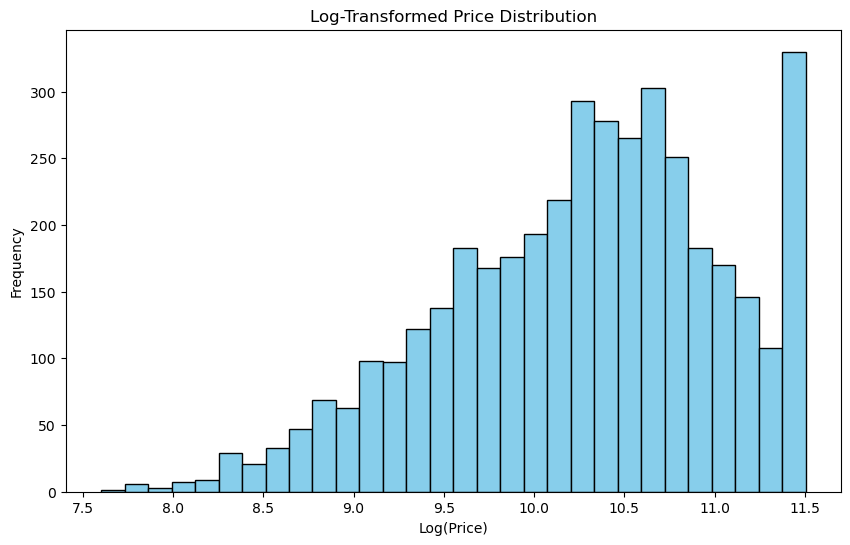

In [45]:
import numpy as np

# Apply log transformation
df['price'] = np.log1p(df['price'])  # log1p is used to handle zero or negative values
df['milage'] = np.log1p(df['milage'])

# Visualize the transformed data
df['price'].plot(kind='hist', bins=30, color='skyblue', edgecolor='black', figsize=(10, 6))
plt.title('Log-Transformed Price Distribution')
plt.xlabel('Log(Price)')
plt.show()

In [46]:
# Remove outliers
df = df[~((df['price'] < lower_bound['price']) | (df['price'] > upper_bound['price']) |
          (df['milage'] < lower_bound['milage']) | (df['milage'] > upper_bound['milage']))]

print("Number of rows after removing outliers:", df.shape[0])

Number of rows after removing outliers: 4009


In [47]:
df

,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price,car_age
0,Ford,Utility Police Interceptor Base,2013,10.839601,E85 Flex Fuel,300.0HP 3.7L V6 Cylinder Engine Flex Fuel Capa...,6-Speed A/T,Black,Black,At least 1 accident or damage reported,Yes,9.239996,11
1,Hyundai,Palisade SEL,2021,10.455733,Gasoline,3.8L V6 24V GDI DOHC,8-Speed Automatic,Moonlight Cloud,Gray,At least 1 accident or damage reported,Yes,10.545499,3
2,Lexus,RX 350 RX 350,2022,10.015610,Gasoline,3.5 Liter DOHC,Automatic,Blue,Black,None reported,Yes,10.907771,2
3,INFINITI,Q50 Hybrid Sport,2015,11.395279,Hybrid,354.0HP 3.5L V6 Cylinder Engine Gas/Electric H...,7-Speed A/T,Black,Black,None reported,Yes,9.648660,9
4,Audi,Q3 45 S line Premium Plus,2021,9.193804,Gasoline,2.0L I4 16V GDI DOHC Turbo,8-Speed Automatic,Glacier White Metallic,Black,None reported,Yes,10.463103,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4004,Bentley,Continental GT Speed,2023,6.572283,Gasoline,6.0L W12 48V PDI DOHC Twin Turbo,8-Speed Automatic with Auto-Shift,C / C,Hotspur,None reported,Yes,11.504651,1
4005,Audi,S4 3.0T Premium Plus,2022,9.296610,Gasoline,349.0HP 3.0L V6 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Black,Black,None reported,Yes,10.894904,2
4006,Porsche,Taycan,2022,7.657755,Gasoline,Electric,Automatic,Black,Black,None reported,Yes,11.418604,2
4007,Ford,F-150 Raptor,2020,10.404293,Gasoline,450.0HP 3.5L V6 Cylinder Engine Gasoline Fuel,A/T,Blue,Black,None reported,Yes,11.050890,4


In [48]:
df.shape

(4009, 13)

# Year Trend Analysis
Analyze price trends over the years by car model.

<Figure size 1400x800 with 0 Axes>

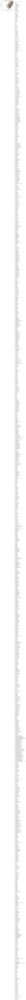

In [49]:
# Group by model_year and model, then calculate average price
yearly_price_trend = df.groupby(['model_year', 'model'])['price'].mean().unstack()

# Plotting the year-wise increase in price for each car model
plt.figure(figsize=(14, 8))
yearly_price_trend.plot(marker='o')
plt.title('Year-wise Increase in Car Price by Model')
plt.xlabel('Model Year')
plt.ylabel('Average Price')
plt.legend(title='Car Model', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()


# Calculate the Correlation Matrix

C:\Users\santh\AppData\Local\Temp\ipykernel_5048\1665664869.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


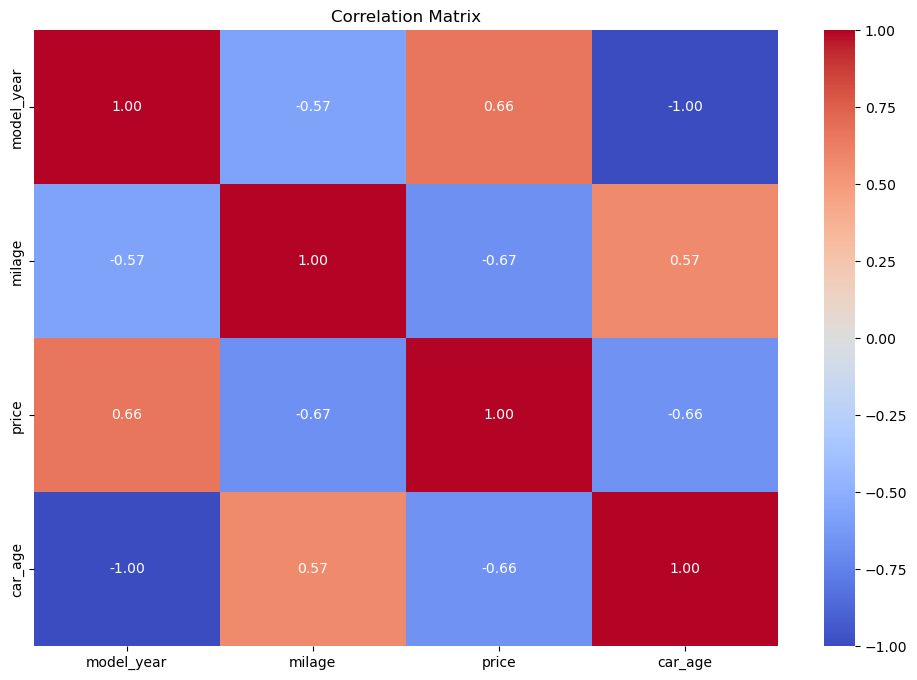

In [50]:
# Calculate the correlation matrix
corr_matrix = df.corr()

# Visualize the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

# Identify Highly Correlated Features

In [51]:
# Set a threshold for identifying high correlations
threshold = 0.8

# Identify pairs of features with a correlation greater than the threshold
high_corr_pairs = np.where(np.abs(corr_matrix) > threshold)
high_corr_pairs = [(corr_matrix.index[x], corr_matrix.columns[y]) for x, y in zip(*high_corr_pairs) if x != y and x < y]

print("Highly Correlated Pairs:", high_corr_pairs)


Highly Correlated Pairs: [('model_year', 'car_age')]


# Remove Highly Correlated Features

In [52]:
# Initialize a set to keep track of features to remove
features_to_remove = set()

for pair in high_corr_pairs:
    feature1, feature2 = pair
    # Remove one feature from the pair (you can remove feature2 or use domain knowledge to choose)
    features_to_remove.add(feature2)

# Remove the highly correlated features from the DataFrame
df_reduced = df.drop(columns=list(features_to_remove))

print("Features removed:", features_to_remove)
print("Remaining features:", df_reduced.columns)


Features removed: {'car_age'}
Remaining features: Index(['brand', 'model', 'model_year', 'milage', 'fuel_type', 'engine',
       'transmission', 'ext_col', 'int_col', 'accident', 'clean_title',
       'price'],
      dtype='object')


# Regression algorithms

In [53]:
df.head()

,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price,car_age
0,Ford,Utility Police Interceptor Base,2013,10.839601,E85 Flex Fuel,300.0HP 3.7L V6 Cylinder Engine Flex Fuel Capa...,6-Speed A/T,Black,Black,At least 1 accident or damage reported,Yes,9.239996,11
1,Hyundai,Palisade SEL,2021,10.455733,Gasoline,3.8L V6 24V GDI DOHC,8-Speed Automatic,Moonlight Cloud,Gray,At least 1 accident or damage reported,Yes,10.545499,3
2,Lexus,RX 350 RX 350,2022,10.015610,Gasoline,3.5 Liter DOHC,Automatic,Blue,Black,None reported,Yes,10.907771,2
3,INFINITI,Q50 Hybrid Sport,2015,11.395279,Hybrid,354.0HP 3.5L V6 Cylinder Engine Gas/Electric H...,7-Speed A/T,Black,Black,None reported,Yes,9.648660,9
4,Audi,Q3 45 S line Premium Plus,2021,9.193804,Gasoline,2.0L I4 16V GDI DOHC Turbo,8-Speed Automatic,Glacier White Metallic,Black,None reported,Yes,10.463103,3


In [55]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import warnings
# Suppress all warnings
warnings.filterwarnings("ignore")



In [74]:
df.drop(columns=['engine'], inplace=True)


In [76]:
df

,brand,model,model_year,milage,fuel_type,transmission,ext_col,int_col,accident,clean_title,price,car_age,horsepower,displacement,cylinders
0,14,1743,2013,10.839601,1,16,29,14,0,0,9.239996,11,300.000000,3.700000,6.0
1,19,1182,2021,10.455733,2,32,185,71,0,0,10.545499,3,332.283839,3.800000,6.0
2,27,1325,2022,10.015610,2,40,38,14,1,0,10.907771,2,332.283839,3.710836,6.0
3,20,1242,2015,11.395279,3,23,29,14,1,0,9.648660,9,354.000000,3.500000,6.0
4,3,1225,2021,9.193804,2,32,120,14,1,0,10.463103,3,332.283839,2.000000,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4004,5,484,2023,6.572283,2,33,50,75,1,0,11.504651,1,332.283839,6.000000,6.0
4005,3,1464,2022,9.296610,2,59,29,14,1,0,10.894904,2,349.000000,3.000000,6.0
4006,43,1677,2022,7.657755,2,40,29,14,1,0,11.418604,2,332.283839,3.710836,6.0
4007,14,666,2020,10.404293,2,38,38,14,1,0,11.050890,4,450.000000,3.500000,6.0


In [82]:
print(df)


      brand  model  model_year     milage  fuel_type  transmission  ext_col  \
0        14   1743        2013  10.839601          1            16       29   
1        19   1182        2021  10.455733          2            32      185   
2        27   1325        2022  10.015610          2            40       38   
3        20   1242        2015  11.395279          3            23       29   
4         3   1225        2021   9.193804          2            32      120   
...     ...    ...         ...        ...        ...           ...      ...   
4004      5    484        2023   6.572283          2            33       50   
4005      3   1464        2022   9.296610          2            59       29   
4006     43   1677        2022   7.657755          2            40       29   
4007     14    666        2020  10.404293          2            38       38   
4008      4   1790        2020  10.668979          2            38      128   

      int_col  accident  clean_title      price  ca

In [83]:
df.isnull().sum()

brand           0
model           0
model_year      0
milage          0
fuel_type       0
transmission    0
ext_col         0
int_col         0
accident        0
clean_title     0
price           0
car_age         0
horsepower      0
displacement    0
cylinders       0
dtype: int64

In [84]:
# Encode categorical columns
label_encoders = {}
for column in ['brand', 'model', 'fuel_type', 'transmission', 'ext_col', 'int_col', 'accident', 'clean_title']:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column])
    label_encoders[column] = le

# Features and target variable
X = df.drop('price', axis=1)
y = df['price']

In [85]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train, X_test, y_train, y_test

(      brand  model  model_year     milage  fuel_type  transmission  ext_col  \
 2473     14    645        2018  11.198899          2            17      128   
 1338     15   1871        2023   9.208439          2             2       29   
 1613      4    970        2016  10.919642          2            20       38   
 1610     27    886        2017  11.255462          2            16      304   
 2600     14    717        2018  10.425283          1            38      128   
 ...     ...    ...         ...        ...        ...           ...      ...   
 1130      7    961        2006  11.608245          2            38      122   
 1294      9      6        1995  11.695255          6             8      304   
 860      38   1175        2016  11.784432          2            41       29   
 3507     14    640        2018  10.791790          2             2      128   
 3174     28   1018        2019  10.491302          2            16      304   
 
       int_col  accident  clean_title 

In [79]:
# Feature scaling (important for some models)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(df)

      brand  model  model_year     milage  fuel_type  transmission  ext_col  \
0        14   1743        2013  10.839601          1            16       29   
1        19   1182        2021  10.455733          2            32      185   
2        27   1325        2022  10.015610          2            40       38   
3        20   1242        2015  11.395279          3            23       29   
4         3   1225        2021   9.193804          2            32      120   
...     ...    ...         ...        ...        ...           ...      ...   
4004      5    484        2023   6.572283          2            33       50   
4005      3   1464        2022   9.296610          2            59       29   
4006     43   1677        2022   7.657755          2            40       29   
4007     14    666        2020  10.404293          2            38       38   
4008      4   1790        2020  10.668979          2            38      128   

      int_col  accident  clean_title      price  ca

In [88]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.preprocessing import PolynomialFeatures

# Dictionary to store results
results = {}

# 1. Linear Regression
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)
results['Linear Regression'] = y_pred_lr

# 2. Ridge Regression
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
y_pred_ridge = ridge.predict(X_test)
results['Ridge Regression'] = y_pred_ridge

# 3. Lasso Regression
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
y_pred_lasso = lasso.predict(X_test)
results['Lasso Regression'] = y_pred_lasso

# 4. ElasticNet Regression
elasticnet = ElasticNet(alpha=0.1, l1_ratio=0.5)
elasticnet.fit(X_train, y_train)
y_pred_elasticnet = elasticnet.predict(X_test)
results['ElasticNet Regression'] = y_pred_elasticnet

# 5. Decision Tree Regression
dt = DecisionTreeRegressor(random_state=42)
dt.fit(X_train, y_train)
y_pred_dt = dt.predict(X_test)
results['Decision Tree Regression'] = y_pred_dt

# 6. Random Forest Regression
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)
results['Random Forest Regression'] = y_pred_rf

# 7. Support Vector Regression (SVR)
svr = SVR(kernel='rbf', C=1.0, epsilon=0.1)
svr.fit(X_train_scaled, y_train)
y_pred_svr = svr.predict(X_test_scaled)
results['Support Vector Regression'] = y_pred_svr

# 8. XGBoost Regression
xgb_reg = XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42)
xgb_reg.fit(X_train, y_train)
y_pred_xgb = xgb_reg.predict(X_test)
results['XGBoost Regression'] = y_pred_xgb

# 9. Polynomial Regression (degree 2)
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X_train)
poly_lr = LinearRegression()
poly_lr.fit(X_poly, y_train)
y_pred_poly = poly_lr.predict(poly.transform(X_test))
results['Polynomial Regression'] = y_pred_poly


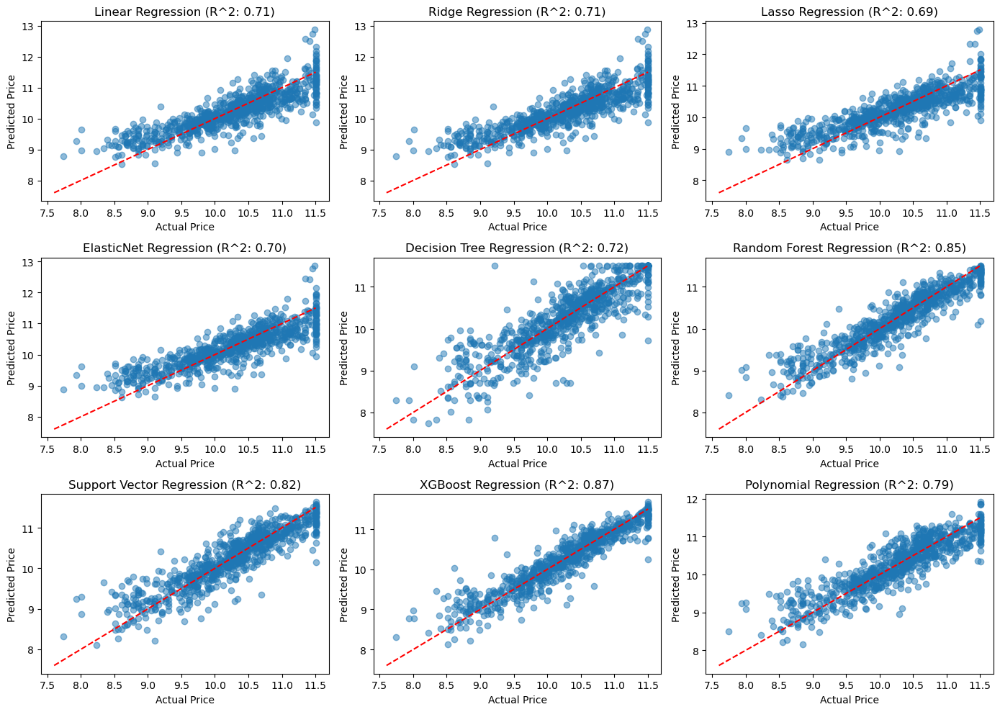

In [89]:
# Plot the results
plt.figure(figsize=(14, 10))

for i, (name, y_pred) in enumerate(results.items()):
    plt.subplot(3, 3, i+1)
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.plot([y.min(), y.max()], [y.min(), y.max()], '--r')
    plt.xlabel('Actual Price')
    plt.ylabel('Predicted Price')
    plt.title(f'{name} (R^2: {r2_score(y_test, y_pred):.2f})')

plt.tight_layout()
plt.show()


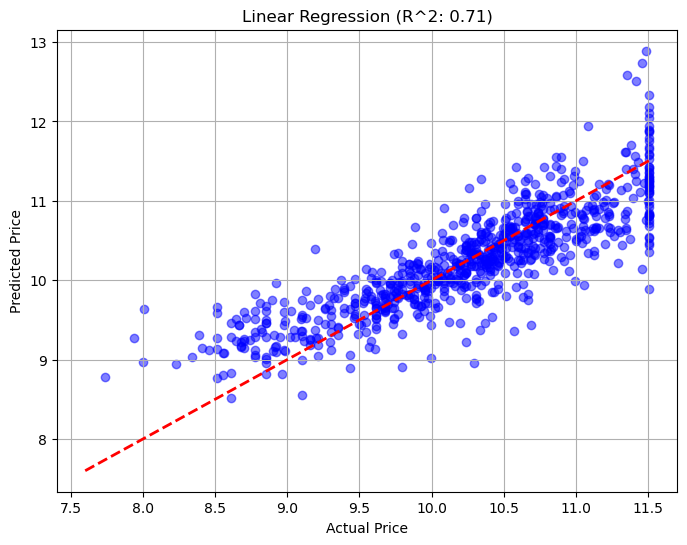

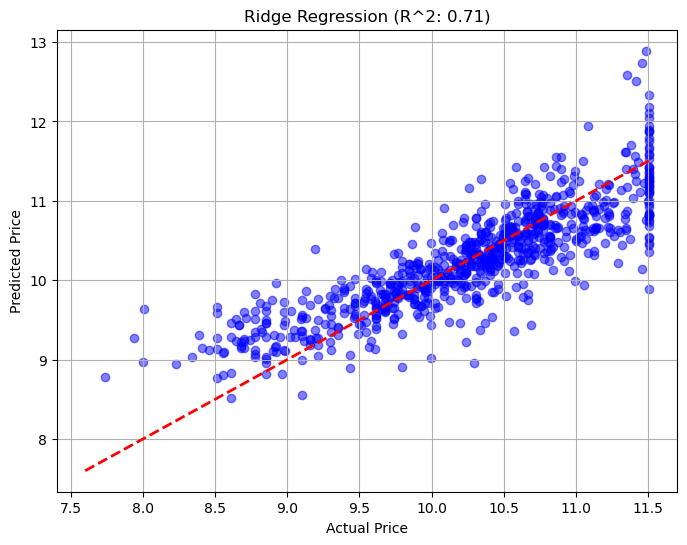

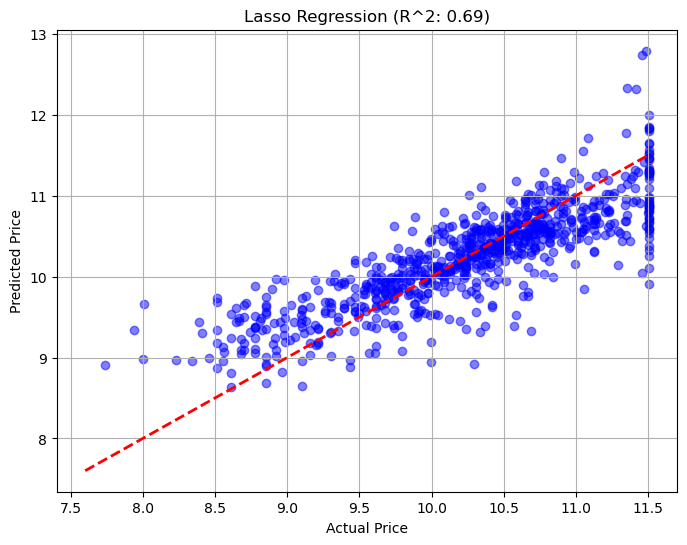

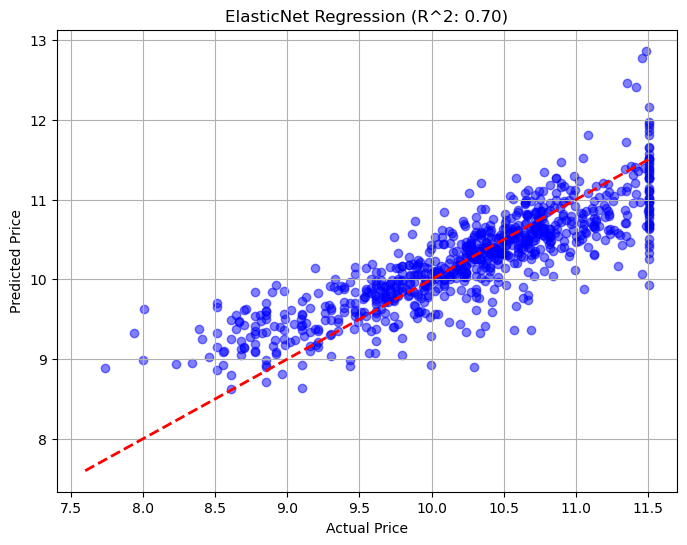

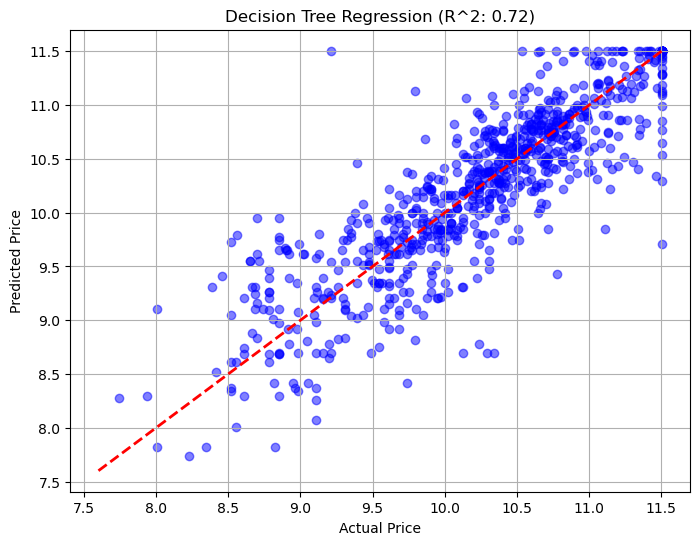

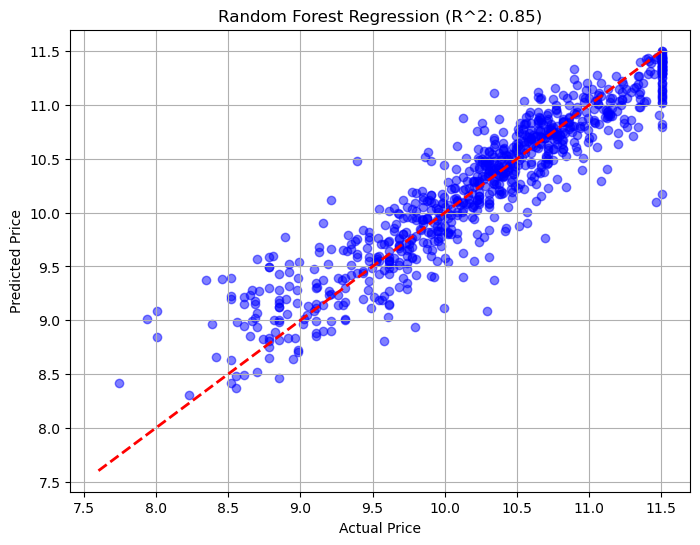

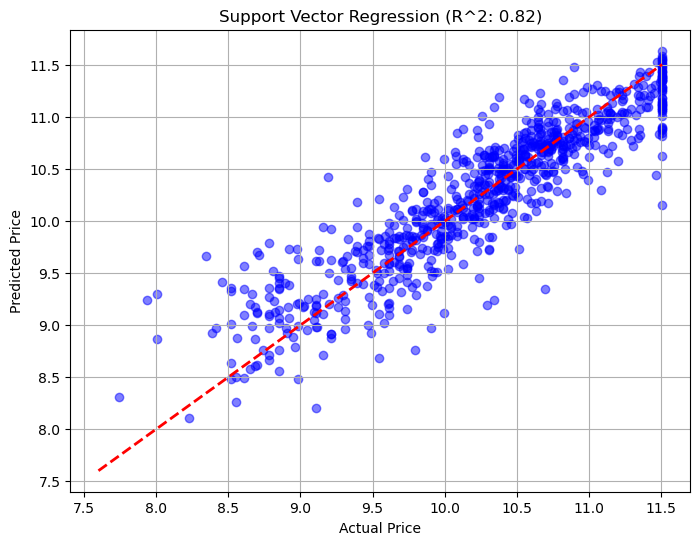

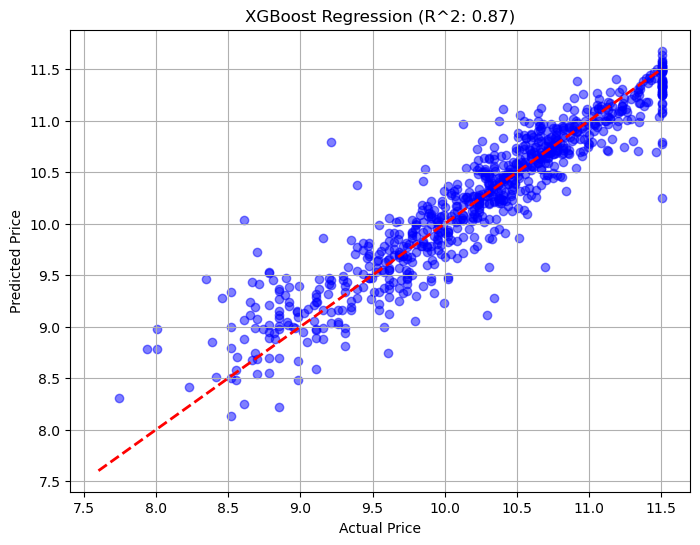

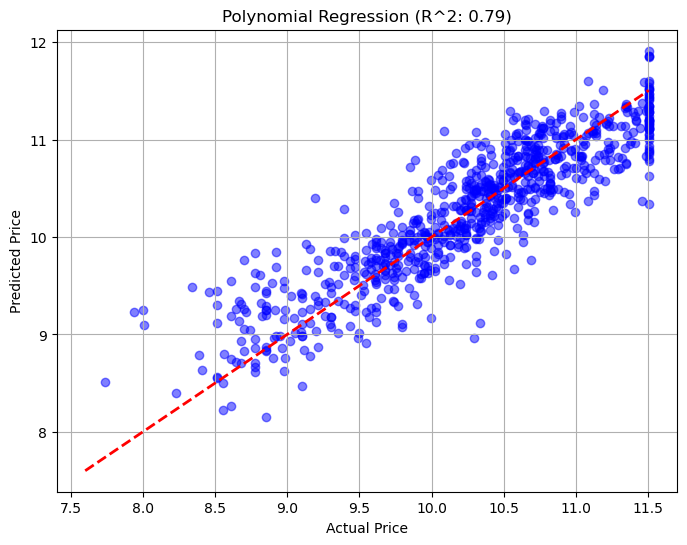

In [90]:
import matplotlib.pyplot as plt

# Iterate over the models and plot the results individually
for name, y_pred in results.items():
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred, alpha=0.5, color='blue')
    plt.plot([y.min(), y.max()], [y.min(), y.max()], '--r', linewidth=2)
    plt.xlabel('Actual Price')
    plt.ylabel('Predicted Price')
    plt.title(f'{name} (R^2: {r2_score(y_test, y_pred):.2f})')
    plt.grid(True)
    plt.show()


# 1. Linear Regression


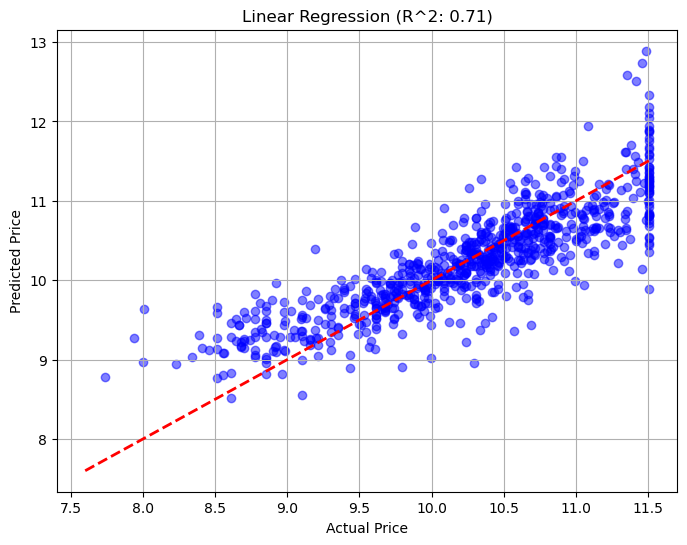

In [91]:
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Linear Regression
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)

# Plotting
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_lr, alpha=0.5, color='blue')
plt.plot([y.min(), y.max()], [y.min(), y.max()], '--r', linewidth=2)
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title(f'Linear Regression (R^2: {r2_score(y_test, y_pred_lr):.2f})')
plt.grid(True)
plt.show()


# 2. Ridge Regression


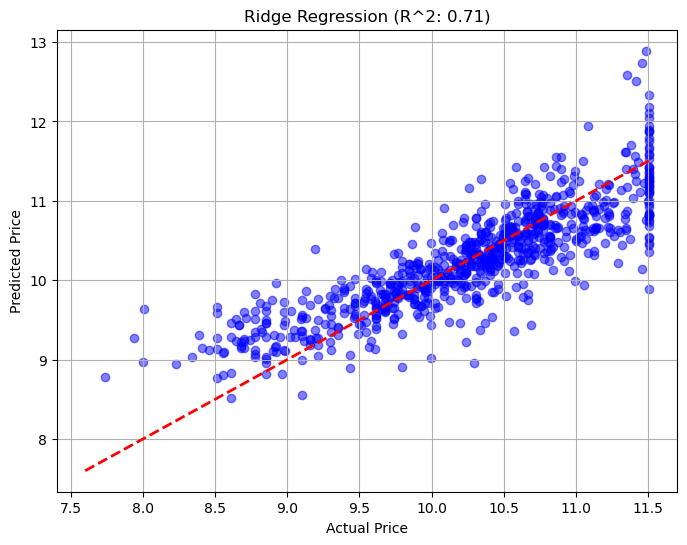

In [92]:
from sklearn.linear_model import Ridge

# Ridge Regression
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
y_pred_ridge = ridge.predict(X_test)

# Plotting
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_ridge, alpha=0.5, color='blue')
plt.plot([y.min(), y.max()], [y.min(), y.max()], '--r', linewidth=2)
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title(f'Ridge Regression (R^2: {r2_score(y_test, y_pred_ridge):.2f})')
plt.grid(True)
plt.show()


# 3. Lasso Regression


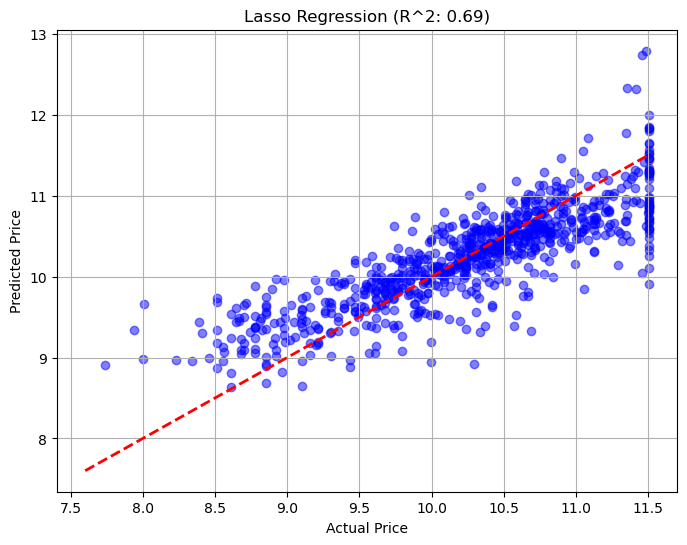

In [93]:
from sklearn.linear_model import Lasso

# Lasso Regression
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
y_pred_lasso = lasso.predict(X_test)

# Plotting
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_lasso, alpha=0.5, color='blue')
plt.plot([y.min(), y.max()], [y.min(), y.max()], '--r', linewidth=2)
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title(f'Lasso Regression (R^2: {r2_score(y_test, y_pred_lasso):.2f})')
plt.grid(True)
plt.show()


# 4. ElasticNet Regression


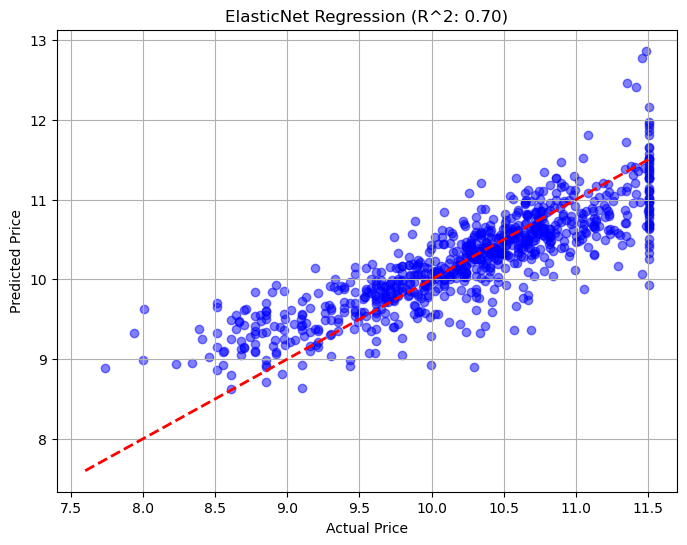

In [95]:
from sklearn.linear_model import ElasticNet

# ElasticNet Regression
elasticnet = ElasticNet(alpha=0.1, l1_ratio=0.5)
elasticnet.fit(X_train, y_train)
y_pred_elasticnet = elasticnet.predict(X_test)

# Plotting
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_elasticnet, alpha=0.5, color='blue')
plt.plot([y.min(), y.max()], [y.min(), y.max()], '--r', linewidth=2)
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title(f'ElasticNet Regression (R^2: {r2_score(y_test, y_pred_elasticnet):.2f})')
plt.grid(True)
plt.show()


# Evaluation Metrics

In [96]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Dictionary to store evaluation metrics
metrics = {}

# Evaluate Linear Regression
metrics['Linear Regression'] = {
    'R^2': r2_score(y_test, y_pred_lr),
    'MAE': mean_absolute_error(y_test, y_pred_lr),
    'MSE': mean_squared_error(y_test, y_pred_lr),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred_lr))
}

# Evaluate Ridge Regression
metrics['Ridge Regression'] = {
    'R^2': r2_score(y_test, y_pred_ridge),
    'MAE': mean_absolute_error(y_test, y_pred_ridge),
    'MSE': mean_squared_error(y_test, y_pred_ridge),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred_ridge))
}

# Evaluate Lasso Regression
metrics['Lasso Regression'] = {
    'R^2': r2_score(y_test, y_pred_lasso),
    'MAE': mean_absolute_error(y_test, y_pred_lasso),
    'MSE': mean_squared_error(y_test, y_pred_lasso),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred_lasso))
}

# Evaluate ElasticNet Regression
metrics['ElasticNet Regression'] = {
    'R^2': r2_score(y_test, y_pred_elasticnet),
    'MAE': mean_absolute_error(y_test, y_pred_elasticnet),
    'MSE': mean_squared_error(y_test, y_pred_elasticnet),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred_elasticnet))
}

# Evaluate Decision Tree Regression
metrics['Decision Tree Regression'] = {
    'R^2': r2_score(y_test, y_pred_dt),
    'MAE': mean_absolute_error(y_test, y_pred_dt),
    'MSE': mean_squared_error(y_test, y_pred_dt),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred_dt))
}

# Evaluate Random Forest Regression
metrics['Random Forest Regression'] = {
    'R^2': r2_score(y_test, y_pred_rf),
    'MAE': mean_absolute_error(y_test, y_pred_rf),
    'MSE': mean_squared_error(y_test, y_pred_rf),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred_rf))
}

# Evaluate Support Vector Regression (SVR)
metrics['Support Vector Regression'] = {
    'R^2': r2_score(y_test, y_pred_svr),
    'MAE': mean_absolute_error(y_test, y_pred_svr),
    'MSE': mean_squared_error(y_test, y_pred_svr),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred_svr))
}

# Evaluate XGBoost Regression
metrics['XGBoost Regression'] = {
    'R^2': r2_score(y_test, y_pred_xgb),
    'MAE': mean_absolute_error(y_test, y_pred_xgb),
    'MSE': mean_squared_error(y_test, y_pred_xgb),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred_xgb))
}

# Evaluate Polynomial Regression
metrics['Polynomial Regression'] = {
    'R^2': r2_score(y_test, y_pred_poly),
    'MAE': mean_absolute_error(y_test, y_pred_poly),
    'MSE': mean_squared_error(y_test, y_pred_poly),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred_poly))
}

# Print the evaluation metrics
for model_name, metrics_values in metrics.items():
    print(f"{model_name}:")
    for metric_name, value in metrics_values.items():
        print(f"  {metric_name}: {value:.4f}")
    print()


Linear Regression:
  R^2: 0.7120
  MAE: 0.3157
  MSE: 0.1749
  RMSE: 0.4182

Ridge Regression:
  R^2: 0.7120
  MAE: 0.3157
  MSE: 0.1749
  RMSE: 0.4182

Lasso Regression:
  R^2: 0.6921
  MAE: 0.3240
  MSE: 0.1870
  RMSE: 0.4325

ElasticNet Regression:
  R^2: 0.7048
  MAE: 0.3163
  MSE: 0.1793
  RMSE: 0.4235

Decision Tree Regression:
  R^2: 0.7228
  MAE: 0.2926
  MSE: 0.1684
  RMSE: 0.4103

Random Forest Regression:
  R^2: 0.8548
  MAE: 0.2165
  MSE: 0.0882
  RMSE: 0.2970

Support Vector Regression:
  R^2: 0.8152
  MAE: 0.2476
  MSE: 0.1123
  RMSE: 0.3350

XGBoost Regression:
  R^2: 0.8733
  MAE: 0.1944
  MSE: 0.0770
  RMSE: 0.2775

Polynomial Regression:
  R^2: 0.7912
  MAE: 0.2733
  MSE: 0.1268
  RMSE: 0.3562

